In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import requests
import cv2
import numpy as np
import matplotlib.pyplot as plt



In [ ]:
moduleHandle = 'https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1'

In [ ]:
detector = hub.load(moduleHandle).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [ ]:
detector

<ConcreteFunction pruned(images) at 0x7FC207079F90>

In [ ]:
imagePath = 'https://futurearchitectureplatform.org/media/cache/c1/02/c102718392d6da8c5669695f672030ae.jpg'
imagePath = 'https://upload.wikimedia.org/wikipedia/commons/a/a7/StreetfoodNY.jpg'
imageResponse = requests. get(imagePath)
toUrl = '/content/sample_image2.jpg'
file = open(toUrl, "wb")
file. write(imageResponse. content)
file. close()


In [ ]:
# 780 * 400
img = tf.io.read_file(toUrl)
img = tf.image.decode_jpeg(img)
convertedImage = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

In [ ]:
prediction = detector(convertedImage)

In [ ]:
h, w, c = img.shape

In [ ]:
def drawBoundingBox(image, topLeft, bottomRight, rgb, thickness):
  cv2.rectangle(image, topLeft, bottomRight,rgb, thickness)
  return image

def drawText(image, txt, topLeft, color, thickness, font = cv2.FONT_HERSHEY_SIMPLEX, fontScale = .7):
  cv2.putText(image, txt, topLeft, font, fontScale, color, thickness)
  return image

# plt.imshow(drawBoundingBox(imgNumpy, (10, 10), (100, 100), (255,0 ,0), 4))
# plt.figure(figsize=(20, 20))
# plt.imshow(drawText(imgNumpy, 'test', (100, 100), (0,255 ,0), 2, fontScale=.8))

In [ ]:
def drawOneBox(boundingBoxes, classNames, score, index, img):
  fy = boundingBoxes[index, 0]
  fx = boundingBoxes[index, 1]
  ly = boundingBoxes[index, 2]
  lx = boundingBoxes[index, 3]
  label = classNames[index].decode('utf-8')
  probs = score[index]
  if probs < .5:
    return
  print(probs)
  
  drawText(img,label + ' ' + '{:.2f}'.format(probs), (int(fx - 10), fy), (0, 255, 0),1,fontScale=.8)
  drawBoundingBox(img, (fx, fy), (lx, ly),(255, 0, 0),1)

In [ ]:
def showAllBoxes(prediction, img):
  boundingBoxes = np.array(prediction['detection_boxes'])
  boundingBoxes[:,0] *= h
  boundingBoxes[:,1] *= w
  boundingBoxes[:,2] *= h
  boundingBoxes[:,3] *= w
  boundingBoxes = boundingBoxes.astype(np.int32)
  classNames = np.array(prediction['detection_class_entities'])
  score = np.array(prediction['detection_scores'])
  row = boundingBoxes.shape[0]
  for i in range(row):
    drawOneBox(boundingBoxes, classNames, score, i, img)
  return img

In [ ]:
imgNumpy = np.array(img)

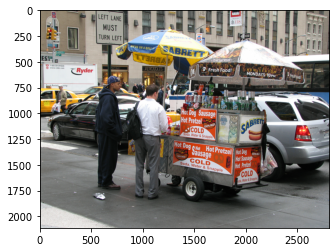

In [ ]:
plt.imshow(imgNumpy)

In [ ]:
img = showAllBoxes(prediction, imgNumpy)

0.8590262
0.83592343
0.7265469
0.65804577
0.60091686
0.5692072
0.55111116
0.53131014
0.50392735


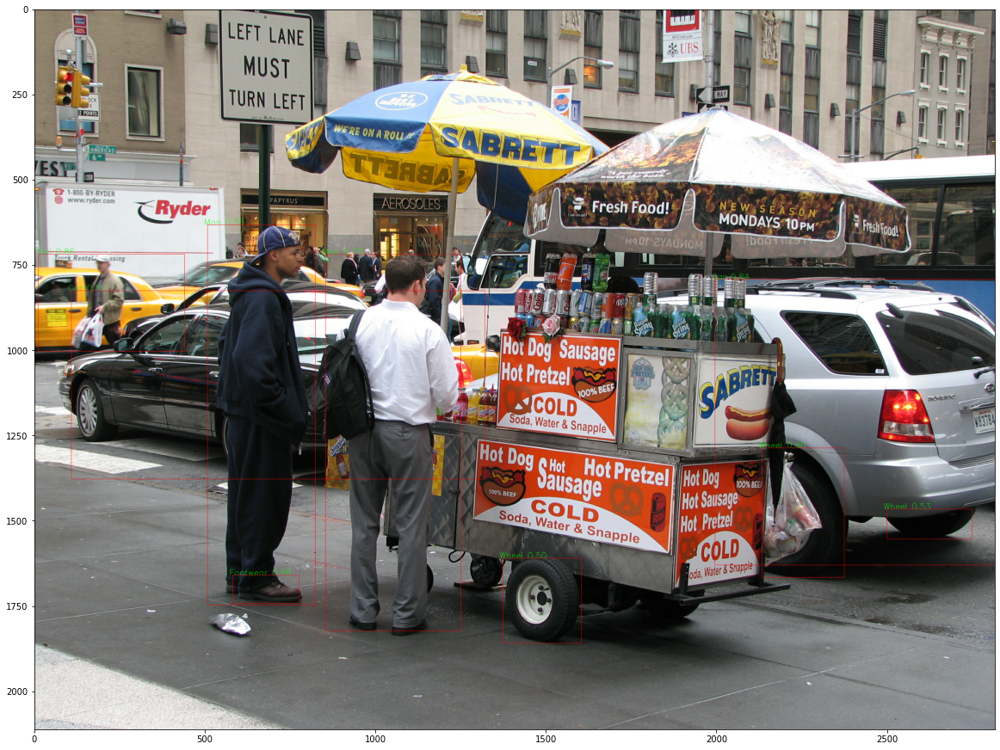

In [ ]:
plt.figure(figsize=(20, 20))
plt.imshow(img)

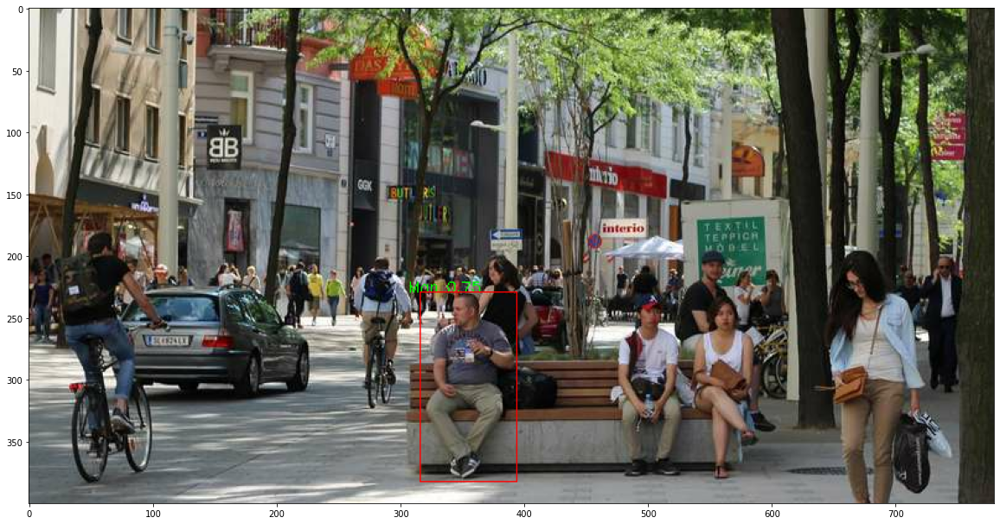

In [ ]:
plt.figure(figsize=(20,20))
drawText(imgNumpy,label + ' ' + '{:.2f}'.format(probs), (int(fx - 10), fy), (0, 255, 0),1,fontScale=.3)
plt.imshow(drawBoundingBox(imgNumpy, (fx, fy), (lx, ly),(255, 0, 0),1))

In [ ]:
'{:.2f}'.format(probs)

'0.75'

In [ ]:
prediction

In [ ]:
from PIL import Image
from IPython.display import display
imgPil = Image.fromarray(imgNumpy)


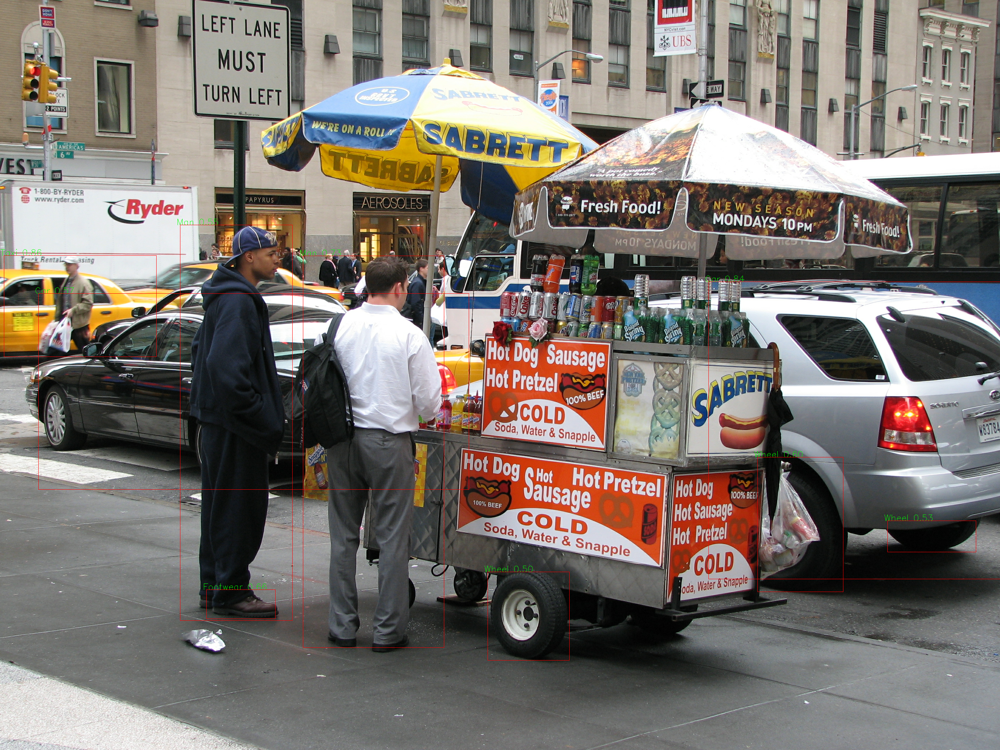

In [ ]:
display(imgPil)